**Lab 5: FIR Filtering 2**

The goal of this lab is to study the response of FIR filters to inputs such as complex exponentials and sinusoids. In the experiments of this lab, you will use `np.convolve()` to implement filters and `freqz()` to obtain the filter’s frequency response. As a result, you should learn how to characterize a filter by knowing how it reacts to different frequency components in the input.
This lab also introduces two practical filters: bandpass filters and nulling filters.
Bandpass filters can be used to detect and extract information from complex signals,
e.g., tones in a touch-tone telephone dialer. Nulling filters can be used to remove
sinusoidal interference, e.g., jamming signals in a radar.

In [11]:
import os
import numpy as np
import librosa
import IPython.display as ipd
from scipy import signal
import matplotlib.pyplot as plt

from util import load_audio, plot_signals, plot_spectrogram, plot_mean_spectrogram, plot_frequency_response

1.1. First, let's replicate what we did until now. Copy the functions synthesize and envelope and obtain the synthesis from the last lab.

In [22]:
# Write your code here
def synthesize(f0, phi, Ak, t):
    y = 0
    for k in range(1, len(Ak) + 1):
        y += Ak[k-1] * np.cos(2*np.pi*k*f0*t + k*phi - (k-1)*np.pi/2)
    return y

def envelope(x, N):
    """
    Extracts the envelope of the input signal x by concatenating a full-wave rectifier and an N-point averaging filter.

    Parameters
    ----------
    x : np.array
        The input signal in the form of a numpy array
    N : int
        The number of points used in N-point averaging filter

    Returns
    -------
    y : np.array
        The output of the system, i.e., the envelope of the signal x.
    """
    # write your code here
    
    w_n = np.abs(x)

    b = np.array([1/N]*N)
    
    y = np.convolve(b,w_n, mode='same')

    return y

filepath = "sis1_group8/guitar2.wav"
ref, fs = load_audio(filepath)

weights = [1, 0.219, 0.093, 0.024, 0.00427, 0.0028, 0.0015, 0.00098, 0.00146, 0.0019, 0.00168]

from IPython.display import Audio
A = 0.2
f0 = 189.0
phi = -np.pi/4 + 0.0005
Ak = np.array(weights, dtype=float)
t = np.arange(len(ref)) / fs

y = synthesize(f0, phi, Ak, t)
y = A * y / np.max(np.abs(y))

N_env = 1000 #higher N value, more smooth signal
env_synth = envelope(ref, N_env)
final_signal = y * env_synth



1.2 Plot both reference and synthesised signal.

In [24]:
# Write your code here
plot_signals( ref, fs)
plot_signals(final_signal, fs)

In [23]:
display(Audio(ref, rate=fs))
display(Audio(final_signal, rate=fs))

---

**2. Averaging filter**

Now let's analyze the frequency response of the average filter used in the envelope function. The Scipy Python module has a function called *freqz()* for computing the frequency
response of a discrete-time LTI system. The following Python statements show how to
use freqz to compute and plot both the magnitude (absolute value) and the phase of
the frequency response of a four-point averaging system as a function of ω in the range − π ≤ ω ≤ π :

In [16]:

ww = np.arange(-np.pi, np.pi, np.pi/500)
_, HH = signal.freqz([1/4]*4, 1, ww)

plot_frequency_response(ww, HH)

For FIR filters, the second argument of `freqz(-, 1,- )` must always be equal to 1. The frequency vector ww should cover an interval of length 2π for ω , and its spacing must be fine enough to give a smooth curve for H(ejω) . Note: we will always use capital H for the frequency response.

2.1 Use the `freqz` and `plot_frequency_response` functions to plot the frequency response of the averaging filter of your envelope function.



In [65]:
# Write your code here
N = 1000 #we used N=1000 for the filter
ww = np.arange(-np.pi, np.pi, np.pi/500) 
_, HH = signal.freqz([1/N]*N, 1, ww)

plot_frequency_response(ww, HH)



2.2 Looking at the frequency responses, what are the main differences between your filter and the four-point averaging filter. What happens when the value N is increased?

Comparing the results in the plot we can see how the 4 point averaging filter in the magnitude H has a prolonged curve through all the w period range, centred at 0. In my filter using N = 1000, the number of bumps is very much larger to a point we can't difference them from a straight line. This happens because for a larger N value, the magnitude frequency contains more bumps. In our case for that large number, the bumps practically overlap. The same will happen for the phase graph.



---

**3. Nulling Filters for Rejection**

Nulling filters are filters that completely eliminate some frequency components. If the frequency is $\omega=0$ or $\omega=\pi$ then a two-point FIR filter will do the nulling. The simplest possible general nulling filter can have as few as three coefficients. If $\omega_n$ is the desired nulling frequency, then the following length-3 FIR filter

$$
y[n] = x[n] - 2\cos(\omega_n)x[n-1] + x[n-2] 
$$

will have a zero in its frequency response at $\omega=\omega_n$. For example, a filter designed to completely eliminate signals of the form $e^{j0.5\pi}$ would have the following coefficients because we would pick the desired nulling frequency to be $\omega_n = 0.5\pi$

$$
b_0 = 1, \quad b1=-2cos(\omega_n)=0, \quad b_2=1
$$

3.1 Use the following function to add an interference in your reference signal. Name the corrupted signal as `x_interf`.

In [76]:
def add_interference(x, fs):
  # Write your code here
  t = np.linspace(0, len(x)*1/float(fs), len(x))
  y = x + (np.amax(x)/10)*np.sin(2*np.pi*1000*t)
  return y

In [75]:
# Write your code here
x_interf = add_interference(ref,fs)


3.2 Plot both the reference signal and the corrupted signal and listen to the latter one. 

In [49]:
# Write your code here
plot_signals( ref, fs)
plot_signals(x_interf, fs)

display(Audio(ref, rate=fs))
display(Audio(x_interf, rate=fs))

3.3 Compare the spectrograms of the reference signal and the interference signal. 

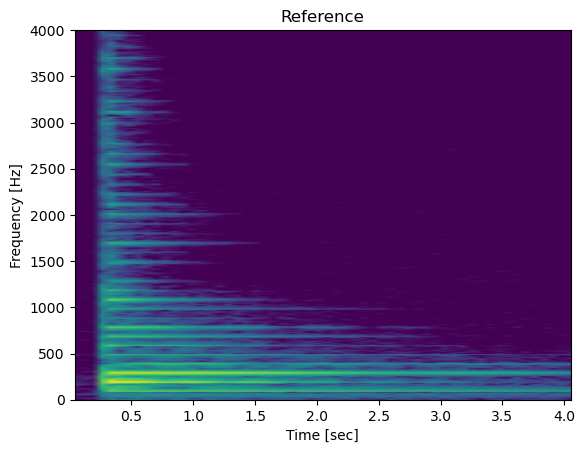

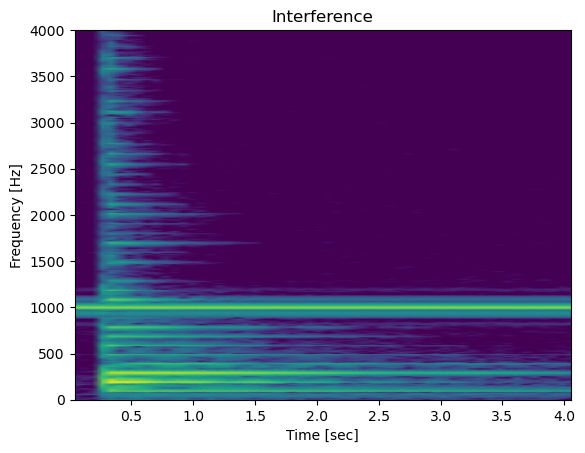

In [74]:
# Write your code here
from scipy.signal import spectrogram

N = 4000

ff, tt, S_ref = spectrogram(ref, fs=fs, nperseg=N, scaling='spectrum' )
ff_int, tt_int, S_int = spectrogram( x_interf, fs=fs,  nperseg=N, scaling='spectrum')

plot_spectrogram(ff, tt, S_ref);  plt.ylim([0, 4000]); plt.title("Reference");  plt.show()
plot_spectrogram(ff_int, tt_int, S_int); plt.ylim([0, 4000]); plt.title("Interference");  plt.show()


3.4. Create a function `remove_interference(x, fs)` that applies a nulling filter devised to remove the interference at 1000 Hz. 

Note: remember that a frequency can be converted to the normalized radian frequncy by: $\omega_n = 2\pi f_n/f_s$

In [73]:
def remove_interference(x, fs):
    """Applies nulling filter to remove an interference at 1000 Hz

    Parameters
    ----------
    x : np.array
    The input signal in the form of a numpy array
    fs : int or float
    Frequency rate in Hz

    Returns
    -------
    y : np.array
    The output of the filter

    """
    # Write your code here
    f_null = 1000.0  

    w_n = 2 * np.pi * f_null / fs 
    
    b = np.array([1, -2 * np.cos(w_n), 1]) #3 tap filter

    return np.convolve(x, b, "same")


3.5 Use the `remove_interference` funcion to clean the corrupted signal,  `x_interf`. Call the output as `x_clean`. Compare the spectrograms of both signals. Explain the result.

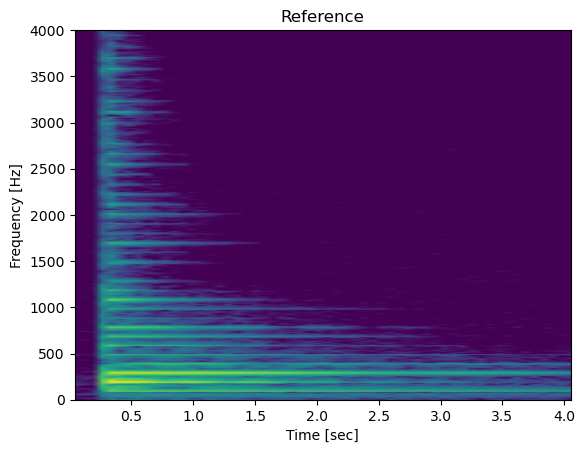

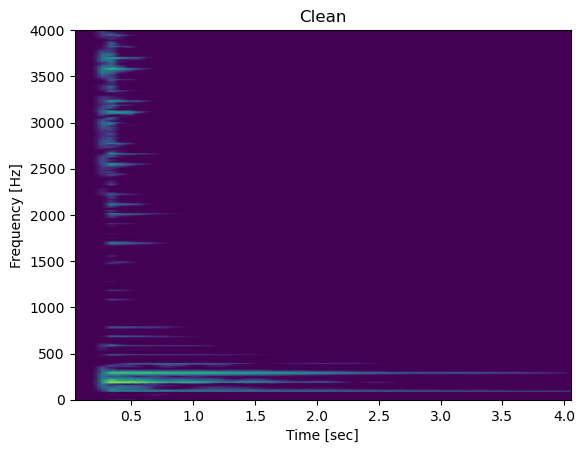

In [71]:
# Write your code here
filepath = "sis1_group8/guitar2.wav"
ref, fs = load_audio(filepath)

x_clean = remove_interference(x_interf, fs)

ff, tt, S_ref = spectrogram(ref, fs=fs, nperseg=N, scaling='spectrum' )
ff_clean, tt_clean, S_clean = spectrogram( x_clean, fs=fs,  nperseg=N, scaling='spectrum')

plot_spectrogram(ff, tt, S_ref);  plt.ylim([0, 4000]); plt.title("Reference");  plt.show()
plot_spectrogram(ff_clean, tt_clean, S_clean); plt.ylim([0, 4000]); plt.title("Clean");  plt.show()

display(Audio(ref, rate=fs))
display(Audio(x_clean, rate=fs))


After computing the cleaning, we can compare the spectograms of the reference and the cleaned version and we see that the values at 1000HZ were practically erased, as there is practically no green presence. So around the 1000HZ are the spectogram shows that it has been cleaned, but also the presence over other values is much lower.